In [ ]:
from google.colab import drive
import cv2 as cv
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pyplot as plt

drive.mount('/content/drive')

Mounted at /content/drive


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
NOMOR 1



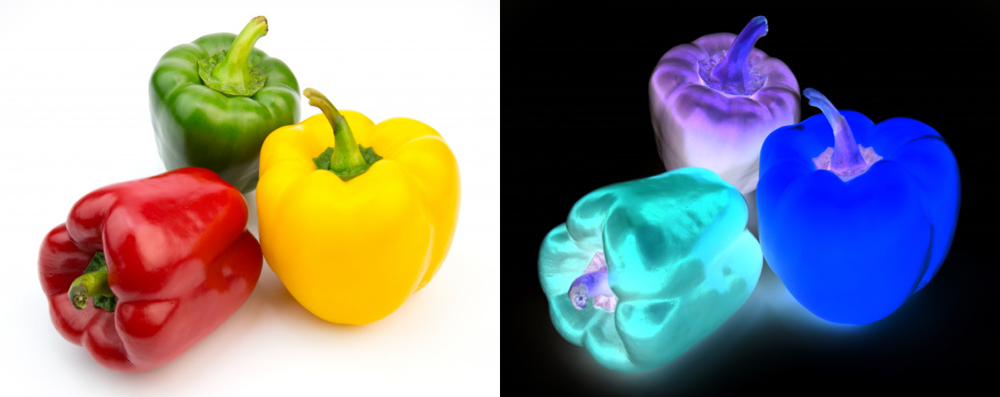

In [ ]:
# NOMOR 1
print('NOMOR 1\n')
original = cv.imread('/content/drive/MyDrive/PCVK/peppers.jpg')
inverse_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      inverse_image[y,x,c] = 255 - original[y,x,c]

final_frame = cv.hconcat((original, inverse_image))
cv2_imshow(final_frame)


NOMOR 2

Masukkan tingkat kecerahan: 10
Masukkan tingkat kontras: 1.5


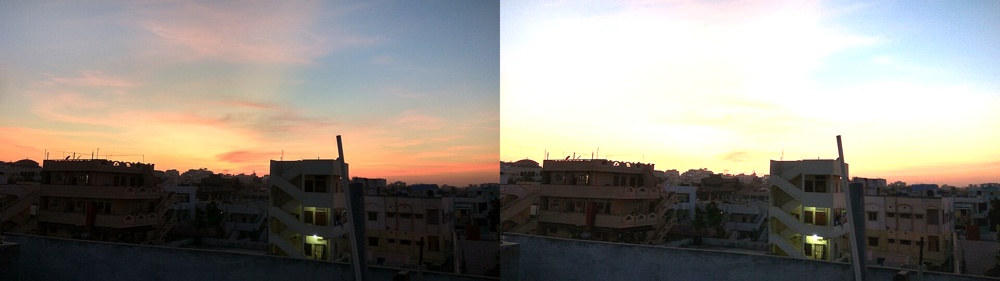

In [ ]:
# NOMOR 2
print('NOMOR 2\n')

try:
  brightness = int(input('Masukkan tingkat kecerahan: '))
  kontras = np.double(input('Masukkan tingkat kontras: '))
except ValueError:
  print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/PCVK/sunset.jpg')
contrast_image = np.zeros_like(original)

for y in range (original.shape[0]):
  for x in range (original.shape[1]):
    for c in range (original.shape[2]):
      contrast_image[y,x,c] = np.clip(kontras * original[y,x,c] + brightness, 0, 255)

final_frame = cv.hconcat((original, contrast_image))
cv2_imshow(final_frame)

NOMOR 3

Mengubah tingkat kecerahan citra dengan Transformasi Log
--------------------------------------------------------
Masukkan nilai kecerahan: 50


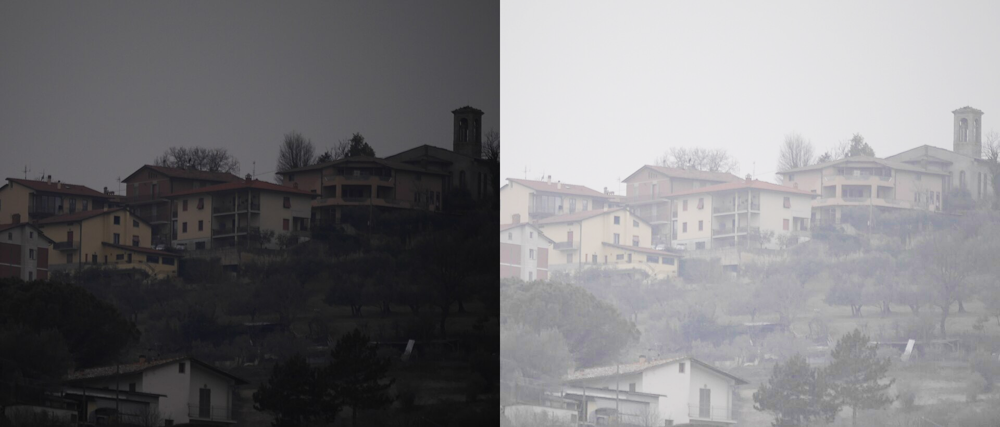

In [ ]:
# NOMOR 3

print('NOMOR 3\n')

brightness = int(input('Masukkan nilai kecerahan: '))

original = cv.imread('/content/drive/MyDrive/PCVK/houses.jpg')

log_image = np.zeros(original.shape, original.dtype)
log_image = brightness * np.log1p(original.astype(np.float32))
log_image = np.clip(log_image, 0, 255).astype(np.uint8)

final_frame = cv.hconcat((original, log_image))
cv2_imshow(final_frame)


Citra Asli


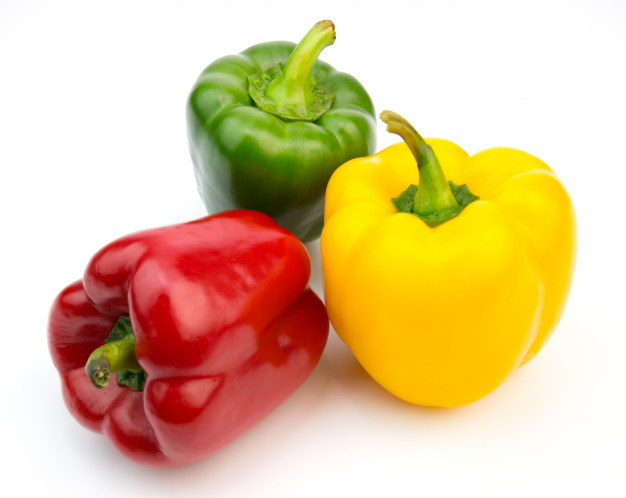

Grayscale Averaging


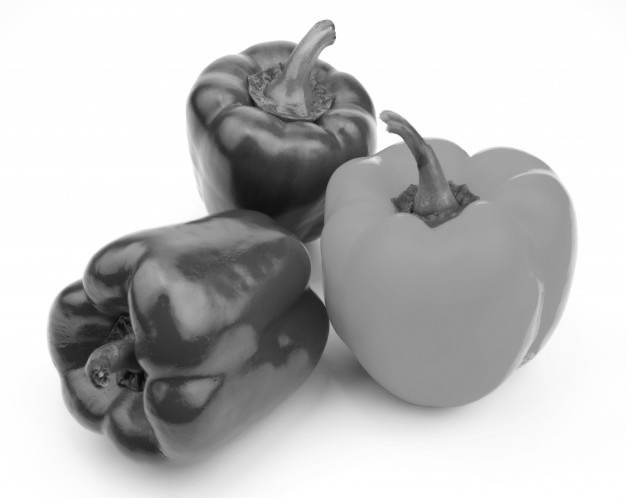

Grayscale Lightness


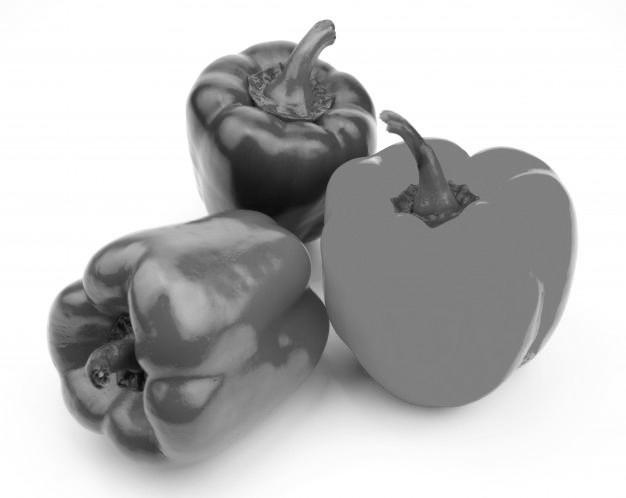

Grayscale Luminance


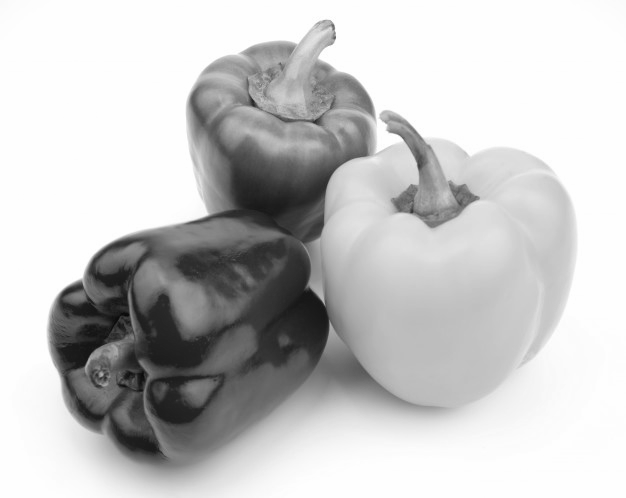

In [ ]:
# NOMOR 4
# membaca citra
original = cv.imread(
    '/content/drive/MyDrive/PCVK/peppers.jpg'
)

# membuat array grayscale
averaging = np.zeros(original.shape[:2], dtype=np.uint8)
lightness = np.zeros(original.shape[:2], dtype=np.uint8)
luminance = np.zeros(original.shape[:2], dtype=np.uint8)

# proses grayscale
for i in range(original.shape[0]):
    for j in range(original.shape[1]):

        # OpenCV: BGR
        B = int(original[i, j, 0])
        G = int(original[i, j, 1])
        R = int(original[i, j, 2])

        # 1. Averaging
        averaging[i, j] = (R + G + B) / 3

        # 2. Lightness
        maximum = max(R, G, B)
        minimum = min(R, G, B)
        lightness[i, j] = (maximum + minimum) / 2

        # 3. Luminance
        luminance[i, j] = 0.21 * R + 0.72 * G + 0.07 * B

# menampilkan hasil
print('Citra Asli')
cv2_imshow(original)

print('Grayscale Averaging')
cv2_imshow(averaging)

print('Grayscale Lightness')
cv2_imshow(lightness)

print('Grayscale Luminance')
cv2_imshow(luminance)

Citra Asli


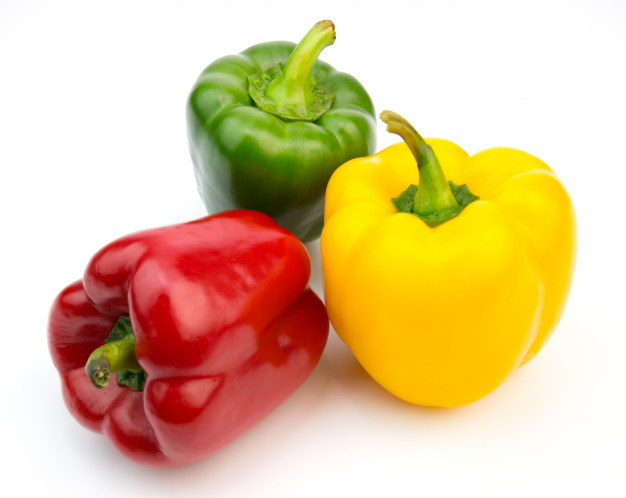

Hasil Image Processing


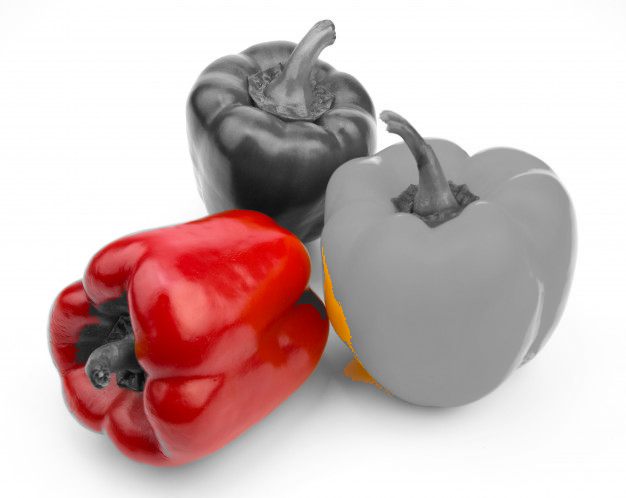

In [ ]:
# NOMOR 5
# membaca citra
original = cv.imread(
    '/content/drive/MyDrive/PCVK/peppers.jpg'
)

# membuat salinan citra
result = original.copy()

# melakukan proses pada setiap pixel
for i in range(original.shape[0]):
    for j in range(original.shape[1]):

        # OpenCV menggunakan urutan BGR
        B = int(original[i, j, 0])
        G = int(original[i, j, 1])
        R = int(original[i, j, 2])

        # mengecek warna merah
        if R > 120 and R > G * 1.6 and R > B * 1.6:

            # warna merah dipertahankan
            result[i, j, 0] = B
            result[i, j, 1] = G
            result[i, j, 2] = R

        else:

            # warna lain diubah menjadi grayscale
            # menggunakan metode Averaging
            gray = (R + G + B) / 3

            result[i, j, 0] = gray
            result[i, j, 1] = gray
            result[i, j, 2] = gray

# menampilkan hasil
print('Citra Asli')
cv2_imshow(original)

print('Hasil Image Processing')
cv2_imshow(result)

Gamma Correction pada citra
----------------------------------
Masukkan nilai Gamma: 2
Citra Asli


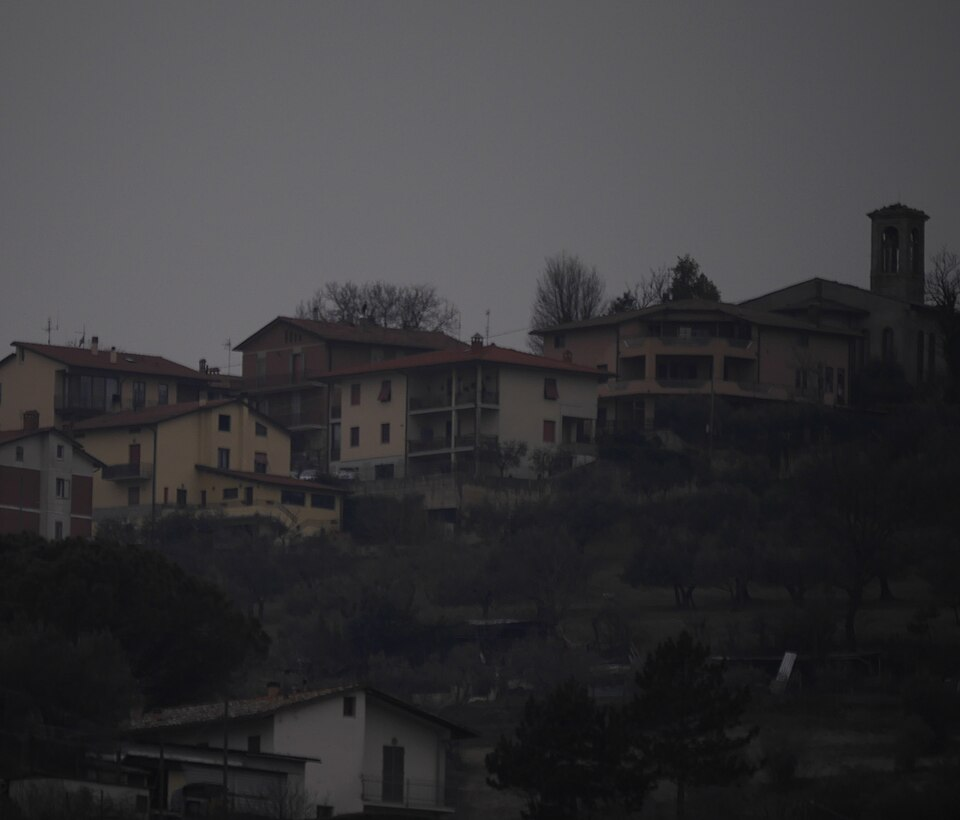

Hasil Gamma Correction dengan Gamma = 2.0


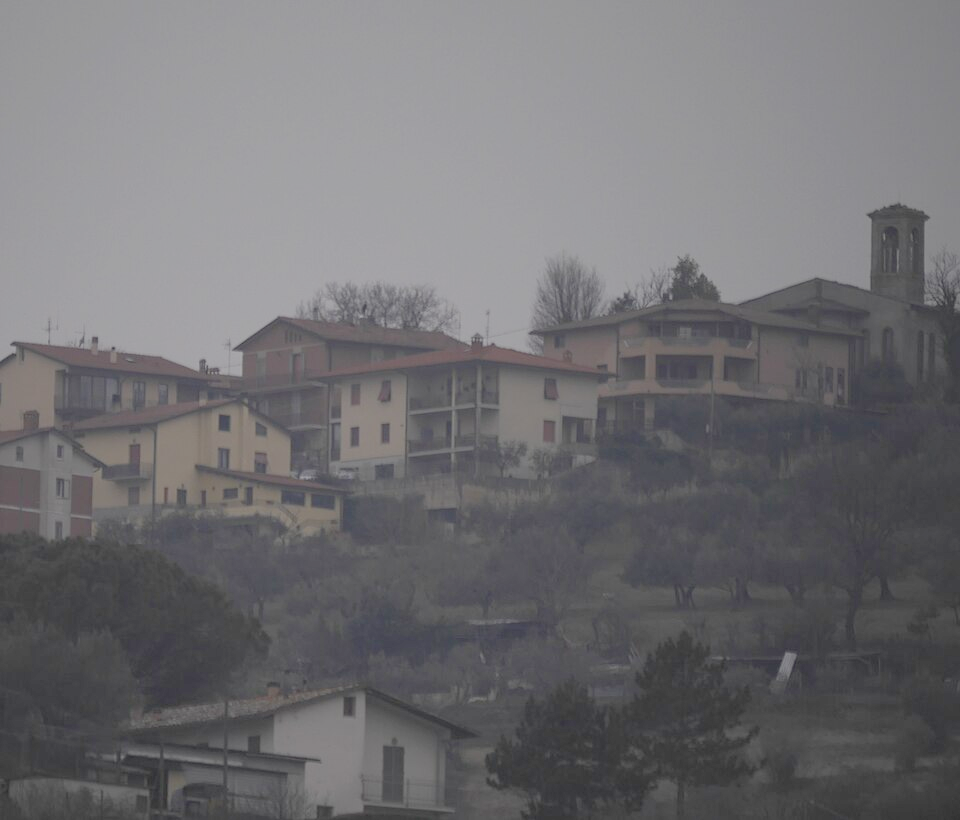

In [ ]:
# NOMOR 6
# Mmmbaca citra
original = cv.imread(
    '/content/drive/MyDrive/PCVK/houses.jpg'
)

# input nilai Gamma
print('Gamma Correction pada citra')
print('----------------------------------')

try:
    gamma = float(input('Masukkan nilai Gamma: '))

    if gamma <= 0:
        print('Gamma harus lebih besar dari 0')

    else:

        # membuat citra hasil
        gamma_image = np.zeros(original.shape, dtype=np.uint8)

        # proses setiap pixel
        for i in range(original.shape[0]):
            for j in range(original.shape[1]):
                for k in range(original.shape[2]):

                    # nilai pixel asli
                    I = int(original[i, j, k])

                    # rumus Gamma Correction
                    I_new = 255 * pow((I / 255), (1 / gamma))

                    # truncate nilai pixel
                    if I_new < 0:
                        I_new = 0
                    elif I_new > 255:
                        I_new = 255

                    # menyimpan nilai pixel
                    gamma_image[i, j, k] = I_new

        # menampilkan hasil
        print('Citra Asli')
        cv2_imshow(original)

        print('Hasil Gamma Correction dengan Gamma =', gamma)
        cv2_imshow(gamma_image)

except ValueError:
    print('Error, not a number')

Citra Grayscale Asli


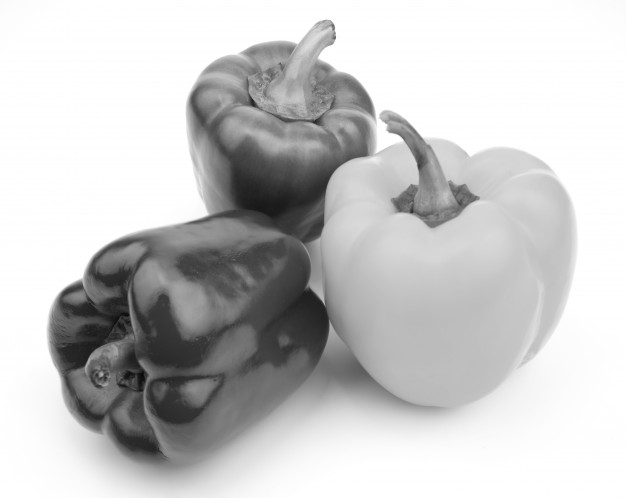

Image Depth = 1 bit


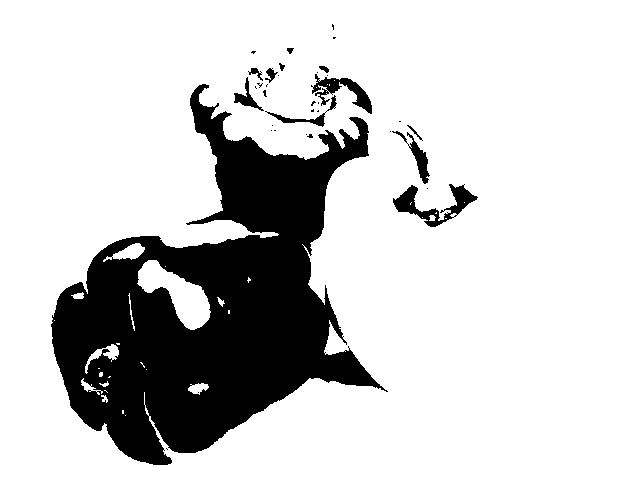

Image Depth = 2 bit


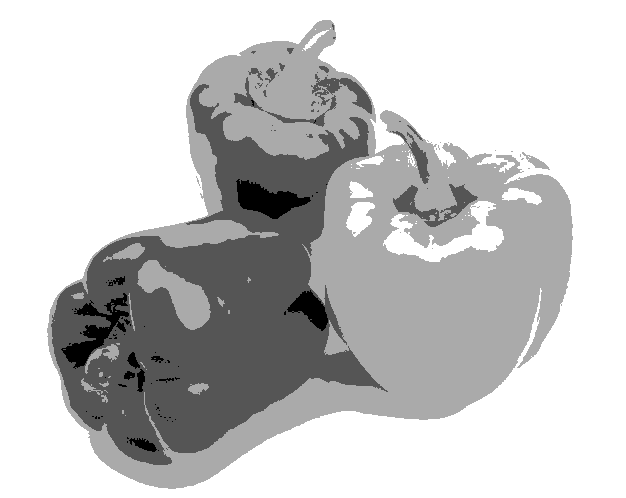

Image Depth = 3 bit


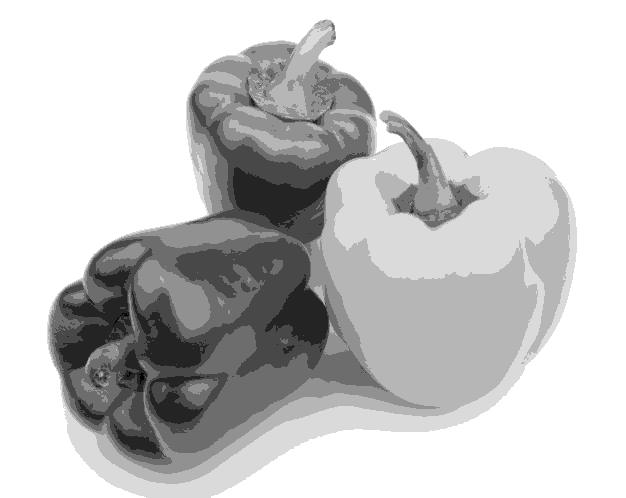

Image Depth = 4 bit


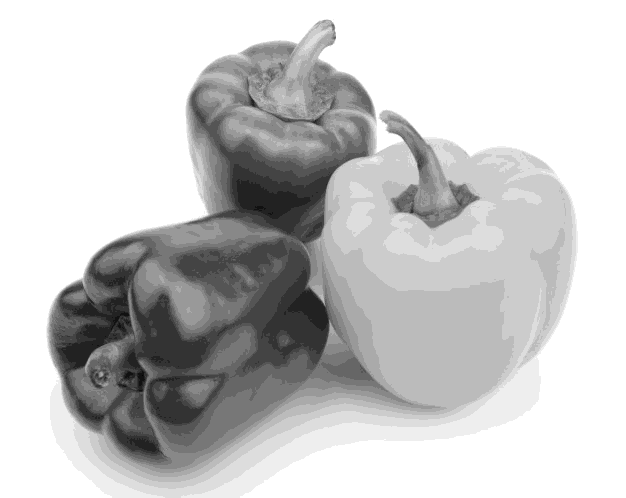

Image Depth = 5 bit


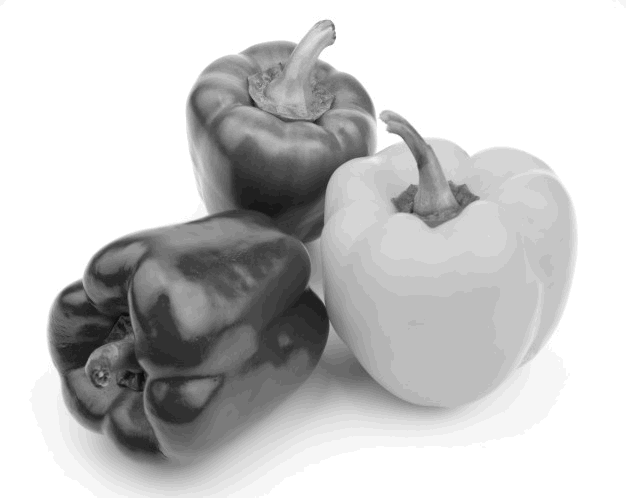

Image Depth = 6 bit


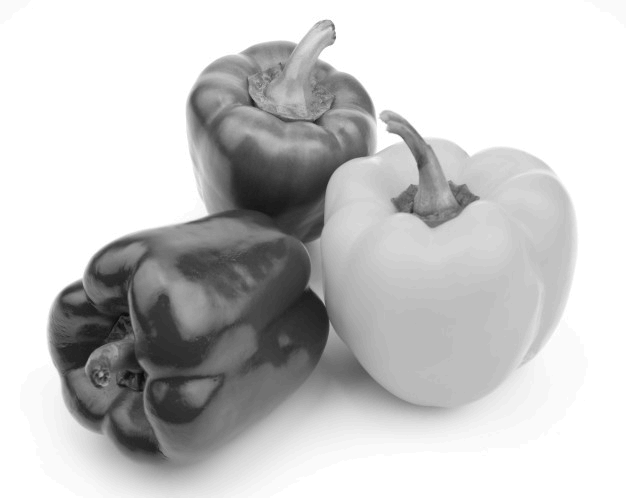

Image Depth = 7 bit


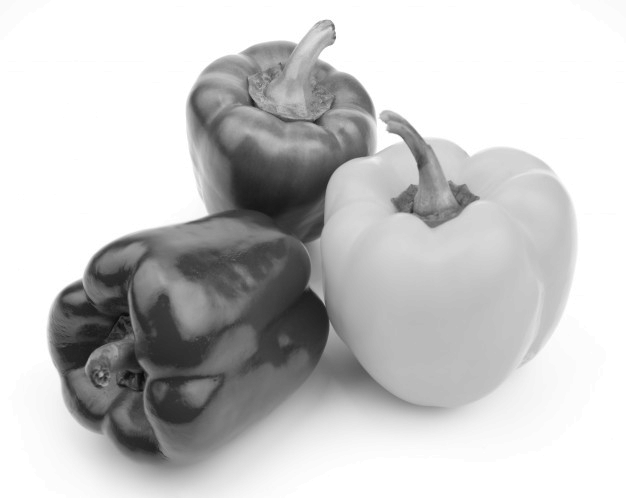

In [ ]:
# NOMOR 7
# membaca citra grayscale
original = cv.imread(
    '/content/drive/MyDrive/PCVK/peppers.jpg',
    cv.IMREAD_GRAYSCALE
)

# menampilkan citra asli
print('Citra Grayscale Asli')
cv2_imshow(original)

# percobaan bit depth 1 sampai 7
for bit_depth in range(1, 8):

    # menghitung level
    level = 255 / (pow(2, bit_depth) - 1)

    # membuat citra hasil
    depth_image = np.zeros(original.shape, original.dtype)

    # proses setiap pixel
    for i in range(original.shape[0]):
        for j in range(original.shape[1]):

            C = int(original[i, j])

            # rumus kuantisasi
            C_new = round(C / level) * level

            # truncate
            if C_new < 0:
                C_new = 0
            elif C_new > 255:
                C_new = 255

            depth_image[i, j] = C_new

    print('Image Depth =', bit_depth, 'bit')
    cv2_imshow(depth_image)

Jumlah citra noise: 100
Average Denoising menggunakan 10 citra
Nilai PSNR = 23.04 dB


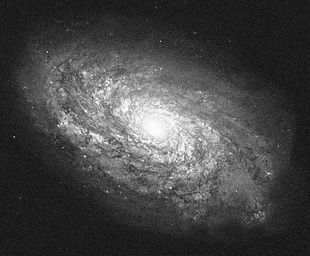

Average Denoising menggunakan 20 citra
Nilai PSNR = 23.68 dB


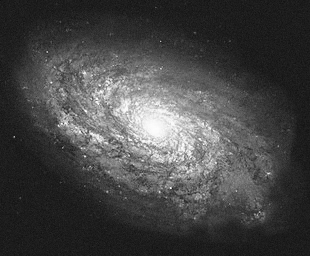

Average Denoising menggunakan 40 citra
Nilai PSNR = 23.56 dB


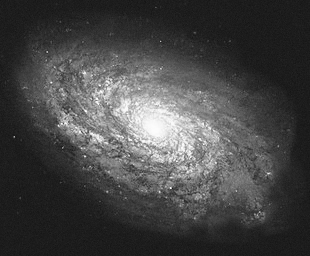

Average Denoising menggunakan 80 citra
Nilai PSNR = 23.5 dB


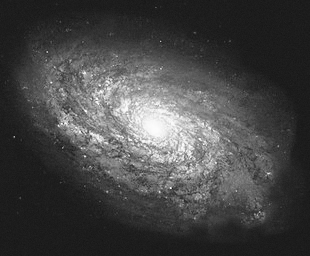

Average Denoising menggunakan 100 citra
Nilai PSNR = 23.49 dB


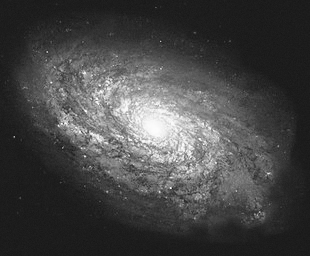


Hasil PSNR:
10 citra  = 23.04 dB
20 citra  = 23.68 dB
40 citra  = 23.56 dB
80 citra  = 23.5 dB
100 citra = 23.49 dB


In [ ]:
#NOMOR 8

import glob
from math import log10

# membaca citra asli
original = cv.imread(
    '/content/drive/MyDrive/PCVK/noises/1.jpg',
    cv.IMREAD_GRAYSCALE
)

# membaca semua citra yang terdapat pada folder noises
cv_img = []

for img in glob.glob(
    '/content/drive/MyDrive/PCVK/noises/*.jpg'
):
    n = cv.imread(img, cv.IMREAD_GRAYSCALE)
    cv_img.append(n)

print('Jumlah citra noise:', len(cv_img))


# fungsi PSNR
def PSNR(img1, img2):
    mse = np.mean((img1.astype(float) - img2.astype(float)) ** 2)

    if mse == 0:
        return 100

    return 20 * log10(255 / np.sqrt(mse))


# jumlah citra yang akan digunakan
jumlah_citra = [10, 20, 40, 80, 100]

hasil_psnr = []

for jumlah in jumlah_citra:

    # membuat array untuk menampung hasil penjumlahan pixel
    average_image = np.zeros(original.shape, dtype=np.float64)

    # menjumlahkan setiap pixel dari sejumlah citra
    for k in range(jumlah):
        average_image += cv_img[k]

    # menghitung nilai rata-rata setiap pixel
    average_image = average_image / jumlah

    # mengubah tipe data menjadi uint8
    average_image = average_image.astype(np.uint8)

    # menghitung PSNR
    psnr = PSNR(original, average_image)
    hasil_psnr.append(psnr)

    # menampilkan hasil
    print('Average Denoising menggunakan', jumlah, 'citra')
    print('Nilai PSNR =', round(psnr, 2), 'dB')
    cv2_imshow(average_image)


# menampilkan tabel hasil
print('\nHasil PSNR:')
print('10 citra  =', round(hasil_psnr[0], 2), 'dB')
print('20 citra  =', round(hasil_psnr[1], 2), 'dB')
print('40 citra  =', round(hasil_psnr[2], 2), 'dB')
print('80 citra  =', round(hasil_psnr[3], 2), 'dB')
print('100 citra =', round(hasil_psnr[4], 2), 'dB')

Citra Asli


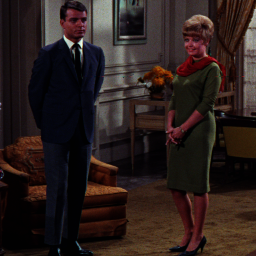

Mask


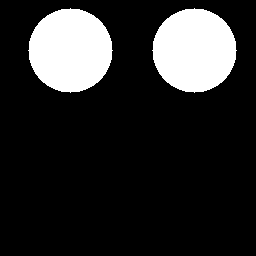

1. NOT (Komplemen)


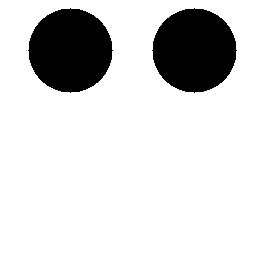

2. OR (Atau)


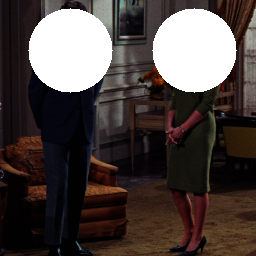

3. AND (Dan)


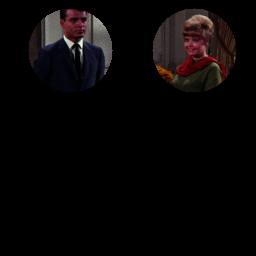

4. NAND (Not And)


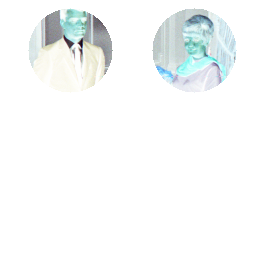

5. XOR (Exclusive Or)


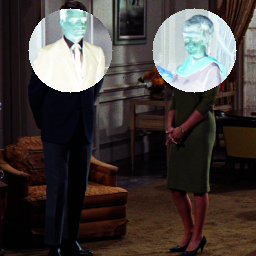

In [ ]:
# NOMOR 9

# membaca citra
original = cv.imread(
    '/content/drive/MyDrive/PCVK/couple.tiff'
)

# membuat mask berwarna hitam
mask = np.zeros(original.shape[:2], dtype=np.uint8)

# membuat dua lingkaran putih pada area objek
# lingkaran pertama untuk objek sebelah kiri
cv.circle(mask, (70, 50), 42, 255, -1)

# lingkaran kedua untuk objek sebelah kanan
cv.circle(mask, (194, 50), 42, 255, -1)

print('Citra Asli')
cv2_imshow(original)

print('Mask')
cv2_imshow(mask)

# 1. NOT (komplemen)
not_mask = cv.bitwise_not(mask)

print('1. NOT (Komplemen)')
cv2_imshow(not_mask)

# 2. OR
or_image = cv.bitwise_or(original, cv.cvtColor(mask, cv.COLOR_GRAY2BGR))

print('2. OR (Atau)')
cv2_imshow(or_image)

# 3. AND
and_image = cv.bitwise_and(original, original, mask=mask)

print('3. AND (Dan)')
cv2_imshow(and_image)

# 4. NAND
nand_image = cv.bitwise_not(and_image)

print('4. NAND (Not And)')
cv2_imshow(nand_image)

# 5. XOR
xor_image = cv.bitwise_xor(original, cv.cvtColor(mask, cv.COLOR_GRAY2BGR))

print('5. XOR (Exclusive Or)')
cv2_imshow(xor_image)

Gamma Correction pada Citra Malam Hari
Citra Asli


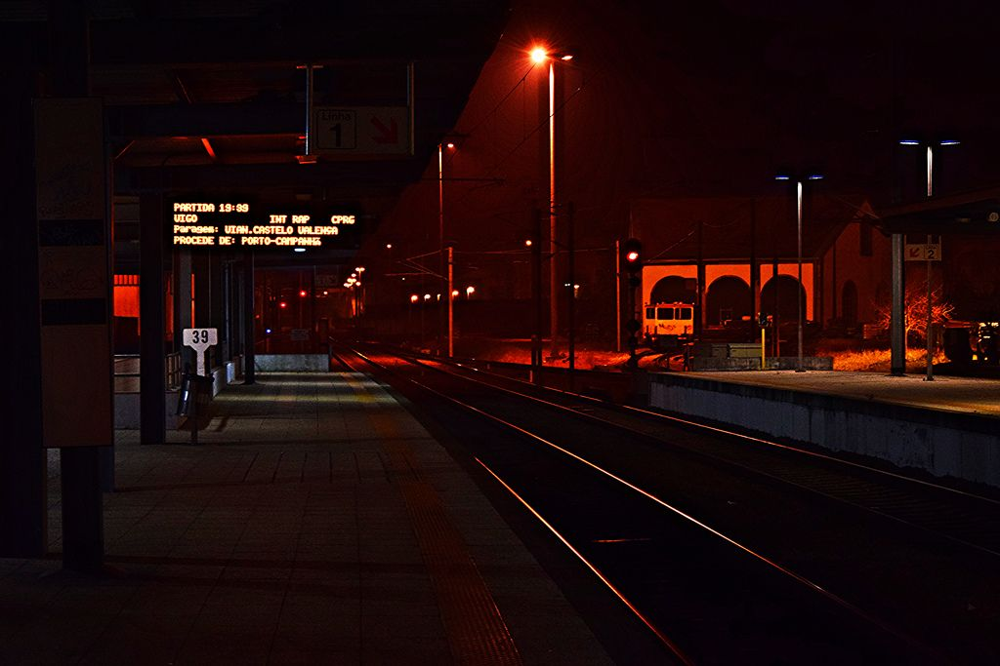

Citra Hasil Gamma Correction (Gamma = 3 )


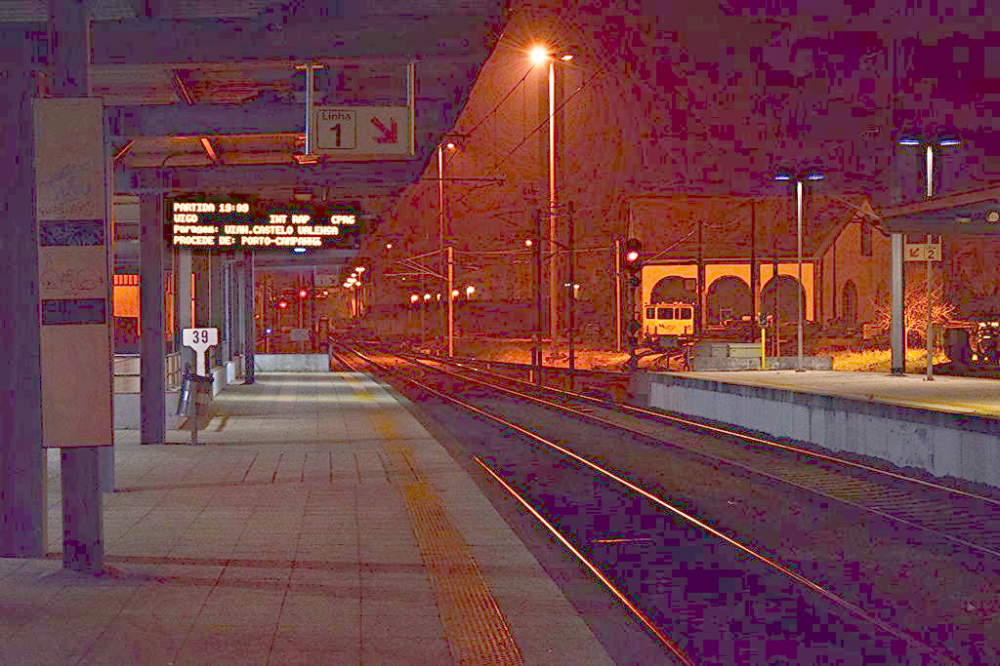

In [ ]:
# NOMOR 10

print('Gamma Correction pada Citra Malam Hari')

# membaca citra
original = cv.imread(
    '/content/drive/MyDrive/PCVK/night.jpg'
)

# menentukan nilai gamma
gamma = 3

# membuat citra hasil
gamma_image = np.zeros(original.shape, original.dtype)

# proses Gamma Correction
for i in range(original.shape[0]):
    for j in range(original.shape[1]):
        for k in range(original.shape[2]):
            I = original[i, j, k]

            # rumus Gamma Correction
            I_new = 255 * pow((I / 255), (1 / gamma))

            # membatasi nilai pixel 0-255
            if I_new > 255:
                I_new = 255
            elif I_new < 0:
                I_new = 0

            gamma_image[i, j, k] = I_new

# menampilkan citra asli
print('Citra Asli')
cv2_imshow(original)

# menampilkan citra hasil
print('Citra Hasil Gamma Correction (Gamma =', gamma, ')')
cv2_imshow(gamma_image)

Gamma Correction pada citra
----------------------------------
Masukkan nilai Gamma: 0.5
Citra Asli


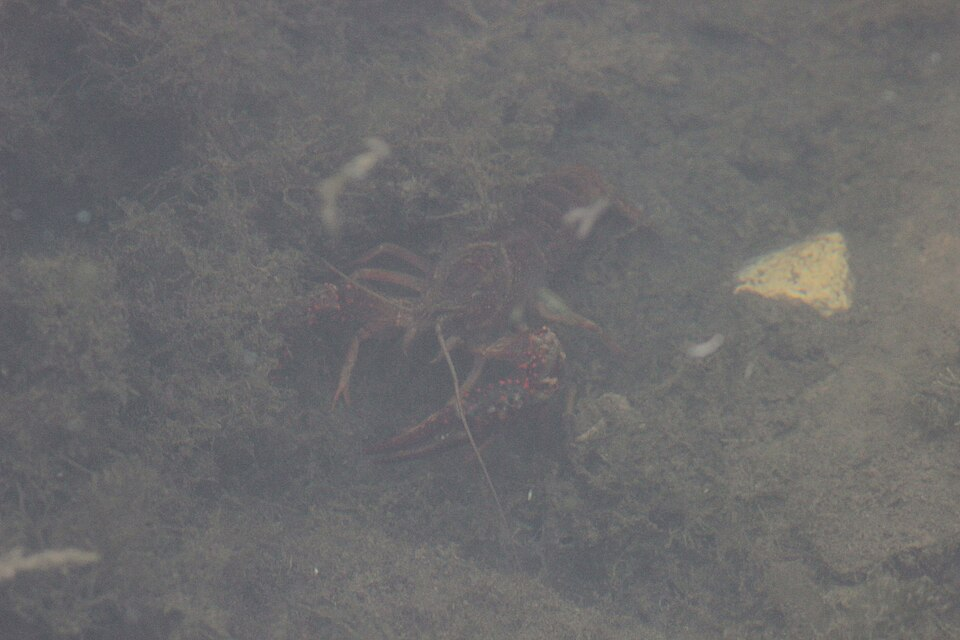

Hasil Gamma Correction dengan Gamma = 0.5


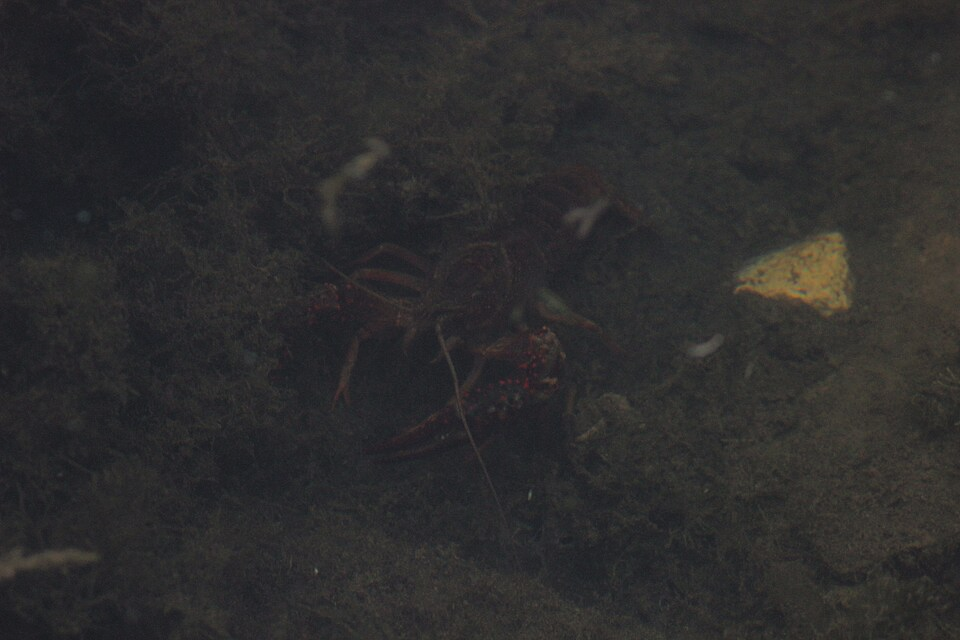

In [ ]:
# NOMOR 11
original = cv.imread(
    '/content/drive/MyDrive/PCVK/crayfish.jpg'
)

# input nilai Gamma
print('Gamma Correction pada citra')
print('----------------------------------')

try:
    gamma = float(input('Masukkan nilai Gamma: '))

    if gamma <= 0:
        print('Gamma harus lebih besar dari 0')

    else:

        # membuat citra hasil
        gamma_image = np.zeros(original.shape, dtype=np.uint8)

        # proses setiap pixel
        for i in range(original.shape[0]):
            for j in range(original.shape[1]):
                for k in range(original.shape[2]):

                    # nilai pixel asli
                    I = int(original[i, j, k])

                    # rumus Gamma Correction
                    I_new = 255 * pow((I / 255), (1 / gamma))

                    # truncate nilai pixel
                    if I_new < 0:
                        I_new = 0
                    elif I_new > 255:
                        I_new = 255

                    # menyimpan nilai pixel
                    gamma_image[i, j, k] = I_new

        # menampilkan hasil
        print('Citra Asli')
        cv2_imshow(original)

        print('Hasil Gamma Correction dengan Gamma =', gamma)
        cv2_imshow(gamma_image)

except ValueError:
    print('Error, not a number')